# <center> GLOBAL TERRORISM - SPARK Internship - Task 2 <center>
## <center> By K. Pavan Kumar <center>

### Importing Libraries

In [1]:
pip install squarify

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import squarify
import imageio
import time
from IPython.display import display,Image as IPImage
from PIL import Image as PILImage

### Importing Data:

In [3]:
data=pd.read_csv('globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')
data.head(30)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
5,197001010002,1970,1,1,NaN,0,NaN,217,United States,1,...,"The Cairo Chief of Police, William Petersen, r...","""Police Chief Quits,"" Washington Post, January...","""Cairo Police Chief Quits; Decries Local 'Mili...","Christopher Hewitt, ""Political Violence and Te...",Hewitt Project,-9,-9,0,-9,NaN
6,197001020001,1970,1,2,NaN,0,NaN,218,Uruguay,3,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
7,197001020002,1970,1,2,NaN,0,NaN,217,United States,1,...,"Damages were estimated to be between $20,000-$...",Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...",NaN,Hewitt Project,-9,-9,0,-9,NaN
8,197001020003,1970,1,2,NaN,0,NaN,217,United States,1,...,The New Years Gang issue a communiqué to a loc...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...","The Wisconsin Cartographers' Guild, ""Wisconsin...",Hewitt Project,0,0,0,0,NaN
9,197001030001,1970,1,3,NaN,0,NaN,217,United States,1,...,"Karl Armstrong's girlfriend, Lynn Schultz, dro...",Committee on Government Operations United Stat...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...",Hewitt Project,0,0,0,0,NaN


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [5]:
data.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
data.shape

(181691, 135)

In [7]:
data.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [8]:
data_new=data[['iyear','imonth','country_txt','region_txt','provstate','city','latitude','longitude','location','summary','success','suicide','attacktype1_txt','attacktype2_txt','attacktype3_txt','targtype1_txt','targsubtype1_txt','target1','gname','motive','weaptype1_txt','nkill','propextent_txt','ransomamt','addnotes','scite1']]

In [9]:
data_new.head()

,iyear,imonth,country_txt,region_txt,provstate,city,latitude,longitude,location,summary,...,targsubtype1_txt,target1,gname,motive,weaptype1_txt,nkill,propextent_txt,ransomamt,addnotes,scite1
0,1970,7,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,NaN,NaN,...,Named Civilian,Julio Guzman,MANO-D,NaN,Unknown,1.0,NaN,NaN,NaN,NaN
1,1970,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,NaN,NaN,...,"Diplomatic Personnel (outside of embassy, cons...","Nadine Chaval, daughter",23rd of September Communist League,NaN,Unknown,0.0,NaN,800000.0,NaN,NaN
2,1970,1,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,NaN,NaN,...,Radio Journalist/Staff/Facility,Employee,Unknown,NaN,Unknown,1.0,NaN,NaN,NaN,NaN
3,1970,1,Greece,Western Europe,Attica,Athens,37.997490,23.762728,NaN,NaN,...,Embassy/Consulate,U.S. Embassy,Unknown,NaN,Explosives,NaN,NaN,NaN,NaN,NaN
4,1970,1,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,NaN,NaN,...,Embassy/Consulate,U.S. Consulate,Unknown,NaN,Incendiary,NaN,NaN,NaN,NaN,NaN


### Exploratory Data Analysis:

In [10]:
data_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 26 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   iyear             181691 non-null  int64  
 1   imonth            181691 non-null  int64  
 2   country_txt       181691 non-null  object 
 3   region_txt        181691 non-null  object 
 4   provstate         181270 non-null  object 
 5   city              181257 non-null  object 
 6   latitude          177135 non-null  float64
 7   longitude         177134 non-null  float64
 8   location          55495 non-null   object 
 9   summary           115562 non-null  object 
 10  success           181691 non-null  int64  
 11  suicide           181691 non-null  int64  
 12  attacktype1_txt   181691 non-null  object 
 13  attacktype2_txt   6314 non-null    object 
 14  attacktype3_txt   428 non-null     object 
 15  targtype1_txt     181691 non-null  object 
 16  targsubtype1_txt  17

In [11]:
data_null_perc=data.isnull().sum()/len(data)*100
data_null_perc

eventid        0.000000
iyear          0.000000
imonth         0.000000
iday           0.000000
approxdate    94.914993
                ...    
INT_LOG        0.000000
INT_IDEO       0.000000
INT_MISC       0.000000
INT_ANY        0.000000
related       86.219461
Length: 135, dtype: float64

In [12]:
data1=data[data_null_perc[data_null_perc<=50].index]
data1.head()

,eventid,iyear,imonth,iday,extended,country,country_txt,region,region_txt,provstate,...,nwoundus,nwoundte,property,ishostkid,scite1,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
0,197000000001,1970,7,2,0,58,Dominican Republic,2,Central America & Caribbean,NaN,...,NaN,NaN,0,0.0,NaN,PGIS,0,0,0,0
1,197000000002,1970,0,0,0,130,Mexico,1,North America,Federal,...,NaN,NaN,0,1.0,NaN,PGIS,0,1,1,1
2,197001000001,1970,1,0,0,160,Philippines,5,Southeast Asia,Tarlac,...,NaN,NaN,0,0.0,NaN,PGIS,-9,-9,1,1
3,197001000002,1970,1,0,0,78,Greece,8,Western Europe,Attica,...,NaN,NaN,1,0.0,NaN,PGIS,-9,-9,1,1
4,197001000003,1970,1,0,0,101,Japan,4,East Asia,Fukouka,...,NaN,NaN,1,0.0,NaN,PGIS,-9,-9,1,1


In [13]:
data1.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'provstate', 'city', 'latitude',
       'longitude', 'specificity', 'vicinity', 'summary', 'crit1', 'crit2',
       'crit3', 'doubtterr', 'multiple', 'success', 'suicide', 'attacktype1',
       'attacktype1_txt', 'targtype1', 'targtype1_txt', 'targsubtype1',
       'targsubtype1_txt', 'corp1', 'target1', 'natlty1', 'natlty1_txt',
       'gname', 'guncertain1', 'individual', 'nperps', 'nperpcap', 'claimed',
       'weaptype1', 'weaptype1_txt', 'weapsubtype1', 'weapsubtype1_txt',
       'weapdetail', 'nkill', 'nkillus', 'nkillter', 'nwound', 'nwoundus',
       'nwoundte', 'property', 'ishostkid', 'scite1', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')

In [14]:
data1.drop(['eventid','iday','extended','country','region','specificity','vicinity','crit1','crit2','crit3','doubtterr',
           'multiple','attacktype1','targtype1','targsubtype1','corp1','natlty1','natlty1_txt','guncertain1','individual','nperps'
           ,'nperpcap','claimed','weaptype1','weapsubtype1','weapsubtype1_txt','weapdetail','nkillus','nkillter','nwound','nwoundus',
           'nwoundte','property','ishostkid','dbsource','INT_LOG','INT_IDEO','INT_MISC','INT_ANY'],axis=1,inplace=True)

In [15]:
data1.columns

Index(['iyear', 'imonth', 'country_txt', 'region_txt', 'provstate', 'city',
       'latitude', 'longitude', 'summary', 'success', 'suicide',
       'attacktype1_txt', 'targtype1_txt', 'targsubtype1_txt', 'target1',
       'gname', 'weaptype1_txt', 'nkill', 'scite1'],
      dtype='object')

In [16]:
data1.head()

,iyear,imonth,country_txt,region_txt,provstate,city,latitude,longitude,summary,success,suicide,attacktype1_txt,targtype1_txt,targsubtype1_txt,target1,gname,weaptype1_txt,nkill,scite1
0,1970,7,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,NaN,1,0,Assassination,Private Citizens & Property,Named Civilian,Julio Guzman,MANO-D,Unknown,1.0,NaN
1,1970,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,NaN,1,0,Hostage Taking (Kidnapping),Government (Diplomatic),"Diplomatic Personnel (outside of embassy, cons...","Nadine Chaval, daughter",23rd of September Communist League,Unknown,0.0,NaN
2,1970,1,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,NaN,1,0,Assassination,Journalists & Media,Radio Journalist/Staff/Facility,Employee,Unknown,Unknown,1.0,NaN
3,1970,1,Greece,Western Europe,Attica,Athens,37.997490,23.762728,NaN,1,0,Bombing/Explosion,Government (Diplomatic),Embassy/Consulate,U.S. Embassy,Unknown,Explosives,NaN,NaN
4,1970,1,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,NaN,1,0,Facility/Infrastructure Attack,Government (Diplomatic),Embassy/Consulate,U.S. Consulate,Unknown,Incendiary,NaN,NaN


In [17]:
data1.isnull().sum()/len(data1)*100

iyear                0.000000
imonth               0.000000
country_txt          0.000000
region_txt           0.000000
provstate            0.231712
city                 0.238867
latitude             2.507554
longitude            2.508104
summary             36.396409
success              0.000000
suicide              0.000000
attacktype1_txt      0.000000
targtype1_txt        0.000000
targsubtype1_txt     5.709144
target1              0.350045
gname                0.000000
weaptype1_txt        0.000000
nkill                5.676120
scite1              36.430533
dtype: float64

In [18]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   iyear             181691 non-null  int64  
 1   imonth            181691 non-null  int64  
 2   country_txt       181691 non-null  object 
 3   region_txt        181691 non-null  object 
 4   provstate         181270 non-null  object 
 5   city              181257 non-null  object 
 6   latitude          177135 non-null  float64
 7   longitude         177134 non-null  float64
 8   summary           115562 non-null  object 
 9   success           181691 non-null  int64  
 10  suicide           181691 non-null  int64  
 11  attacktype1_txt   181691 non-null  object 
 12  targtype1_txt     181691 non-null  object 
 13  targsubtype1_txt  171318 non-null  object 
 14  target1           181055 non-null  object 
 15  gname             181691 non-null  object 
 16  weaptype1_txt     18

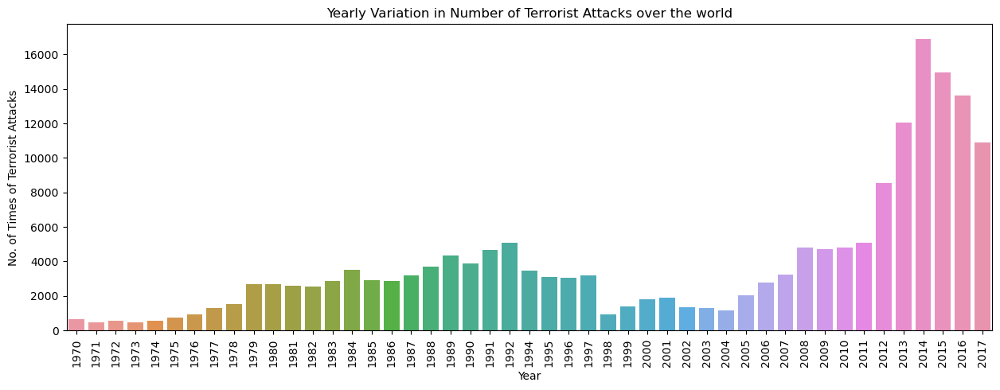

In [19]:
# Plotting Yearly variation of Terror Attacks over the world
plt.figure(figsize=(15,5))
sns.countplot(data=data1,x='iyear')
plt.xticks(rotation=90)
plt.xlabel('Year')
plt.ylabel('No. of Times of Terrorist Attacks')
plt.title('Yearly Variation in Number of Terrorist Attacks over the world')
plt.show()

'2014' is the year with most number of Terror attacks worldwide.

In [20]:
data1.country_txt.value_counts()

Iraq                   24636
Pakistan               14368
Afghanistan            12731
India                  11960
Colombia                8306
                       ...  
International              1
Wallis and Futuna          1
South Vietnam              1
Andorra                    1
Antigua and Barbuda        1
Name: country_txt, Length: 205, dtype: int64

Text(0.5, 1.0, 'Squarify Plot showing different Countries in squares according to number of attacks')

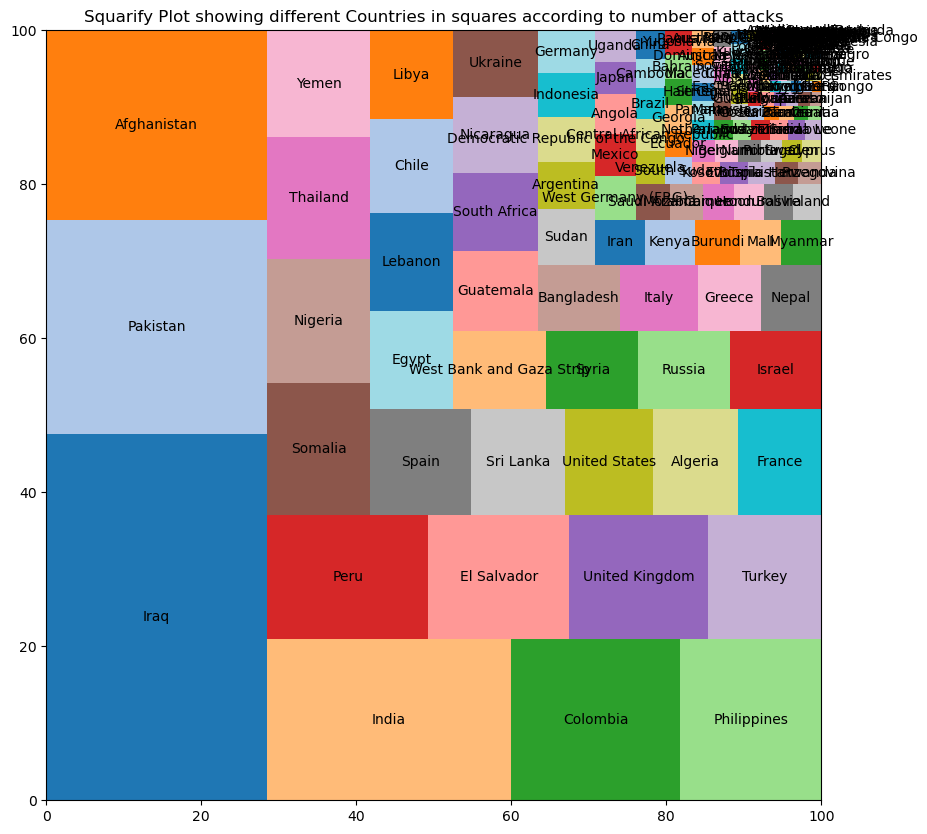

In [21]:
# Plotting Squarify Plot
plt.figure(figsize=(10,10))
squarify.plot(sizes=data1.country_txt.value_counts().values,label=data1.country_txt.value_counts().index,color=sns.color_palette('tab20',len(data1.country_txt.value_counts())))
plt.title('Squarify Plot showing different Countries in squares according to number of attacks')

'Iraq' country is the most hotspot for Terrorist Attacks over many years.

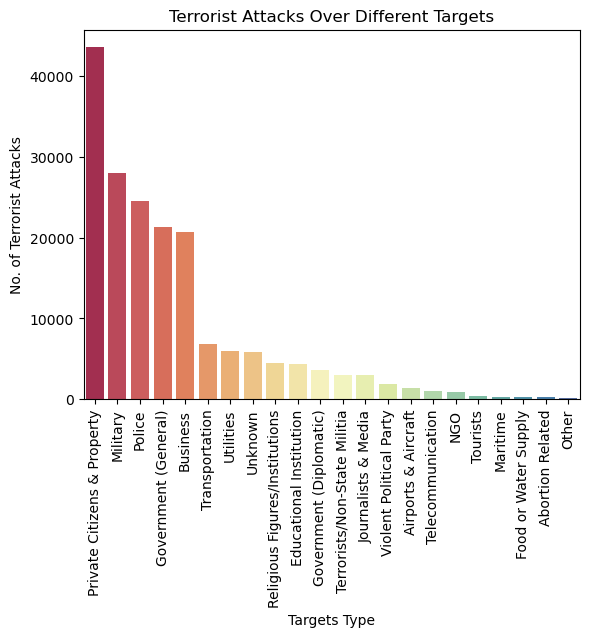

In [22]:
# Countplot of Targets involved in Terrorist Attacks
sns.countplot(x='targtype1_txt',data=data1,order=data1.targtype1_txt.value_counts().index,palette='Spectral')
plt.xticks(rotation=90)
plt.xlabel('Targets Type')
plt.ylabel('No. of Terrorist Attacks')
plt.title('Terrorist Attacks Over Different Targets')
plt.show()

'Private Citizens & Property', 'Military', 'Police' are the top Targets over which attacks been made by Terrorists

In [23]:
pip install folium

In [24]:
pip install basemap

In [25]:
latitudes=list(data1.latitude)
longitudes=list(data1.longitude)

In [26]:
from mpl_toolkits.basemap import Basemap

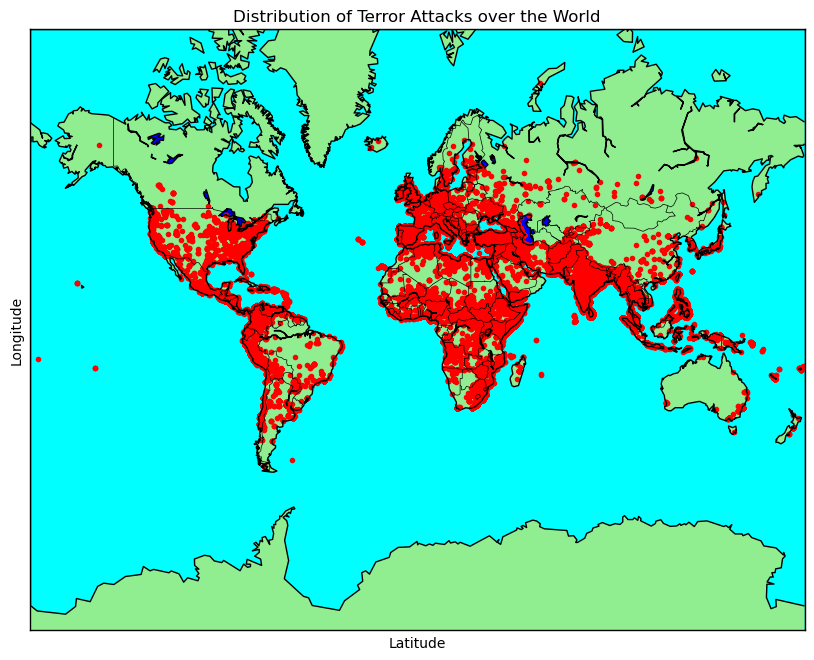

In [27]:
# plottin world to see various locations over which terror attacks happended during the period 1970-2017
plt.figure(figsize=(10,10))
worldmap=Basemap(projection='merc',resolution='c',llcrnrlat=-80,urcrnrlat=80,llcrnrlon=-180,urcrnrlon=180)
worldmap.drawcoastlines()
worldmap.drawcountries()
x,y=worldmap(longitudes,latitudes)
worldmap.fillcontinents(color='lightgreen',lake_color='blue')
worldmap.drawmapboundary(fill_color='aqua')
worldmap.scatter(x,y,color='red',marker='.')
plt.ylabel('Longitude')
plt.xlabel('Latitude')
plt.title('Distribution of Terror Attacks over the World')
plt.show()

In [28]:
data1.columns

Index(['iyear', 'imonth', 'country_txt', 'region_txt', 'provstate', 'city',
       'latitude', 'longitude', 'summary', 'success', 'suicide',
       'attacktype1_txt', 'targtype1_txt', 'targsubtype1_txt', 'target1',
       'gname', 'weaptype1_txt', 'nkill', 'scite1'],
      dtype='object')

Text(0.5, 1.0, 'Terrorist Attacks over Different Months')

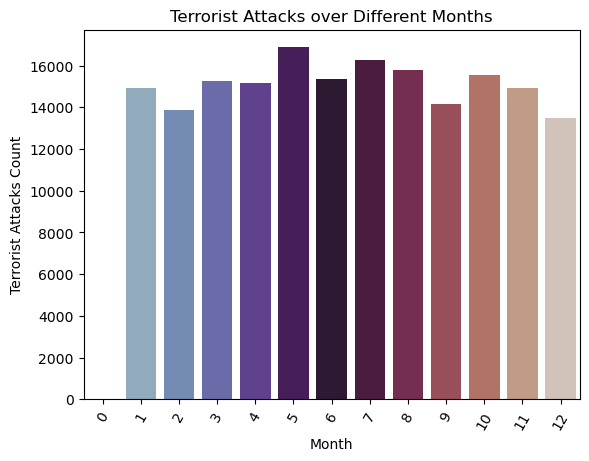

In [29]:
# Countplot of Months during which terror attacks happened
sns.countplot(data=data1,x=data1.imonth,palette='twilight')
plt.xticks(rotation=60)
plt.xlabel('Month')
plt.ylabel('Terrorist Attacks Count')
plt.title('Terrorist Attacks over Different Months')

Text(0.5, 1.0, 'Terrorist Attacks over Different Regions')

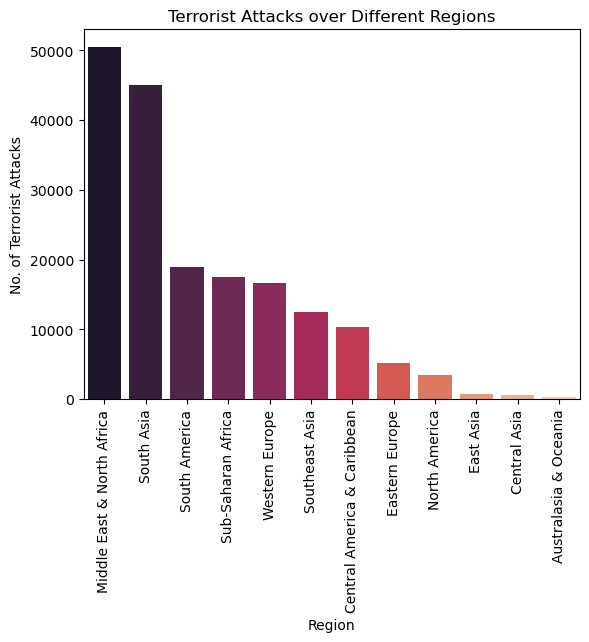

In [30]:
# Countplot to see different regions over which terror attacks happened
sns.countplot(data=data1,x=data1.region_txt,order=data1.region_txt.value_counts().index,palette='rocket')
plt.xticks(rotation=90)
plt.xlabel('Region')
plt.ylabel('No. of Terrorist Attacks')
plt.title('Terrorist Attacks over Different Regions')

'Middle East & North Africa' and 'South Asia' are the most hotspot regions of the Terrorist Attacks.

In [31]:
print('Out of Total Terror Attacks, the percentage of successful Terror Attacks is:',sum(data1.success)/len(data1.success)*100)

Out of Total Terror Attacks, the percentage of successful Terror Attacks is: 88.95982739926579


In [32]:
print('Out of Total Succesful Terror Attacks, the percentage of Suicide Attacks is:',sum(data1.suicide)/sum(data1.success)*100)

Out of Total Succesful Terror Attacks, the percentage of Suicide Attacks is: 4.1037665808750745


Text(0.5, 1.0, 'Types of Terror Attacks over the World')

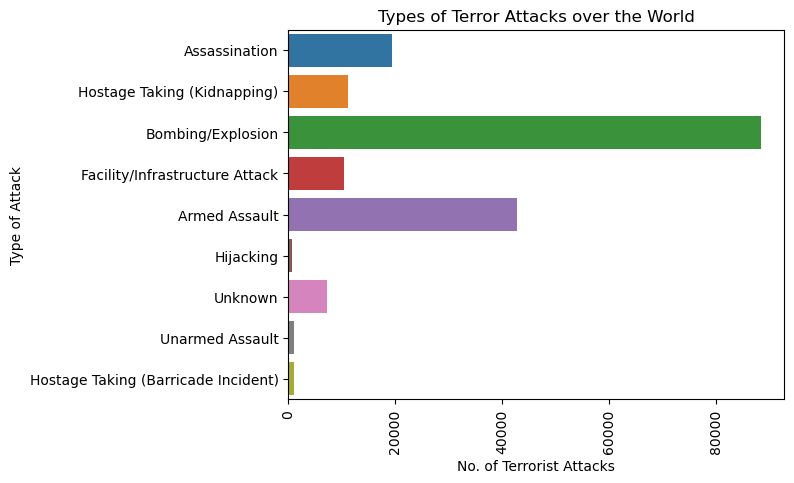

In [33]:
# Countplot of types of terror attacks happened over the world
sns.countplot(data=data1,y='attacktype1_txt')
plt.xticks(rotation=90)
plt.ylabel('Type of Attack')
plt.xlabel('No. of Terrorist Attacks')
plt.title('Types of Terror Attacks over the World')

'Bombing/Explosion', 'Armed Assault' are the major types of Terror Attacks.

Text(0.5, 1.0, 'Sub Types of Targets over which Terror Attacks been made')

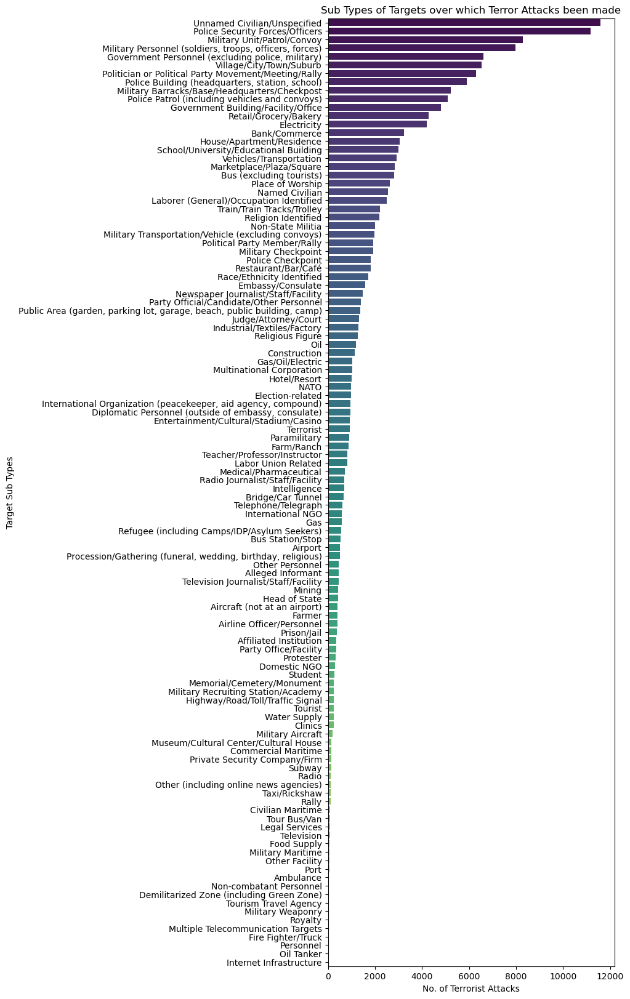

In [34]:
# Countplot of Sub Target Types over which terror attacks happened
plt.figure(figsize=(6,20))
sns.countplot(data=data1,y='targsubtype1_txt',palette='viridis',order=data1.targsubtype1_txt.value_counts().index)
plt.ylabel('Target Sub Types')
plt.xlabel('No. of Terrorist Attacks')
plt.title('Sub Types of Targets over which Terror Attacks been made')

1. 'Unnamed Civilians/Unspecified' and 'Police Security Forces/Officers' are top two sub target types for Terror Attacks.
2. Next to them are 'Military Unit' and 'Military Personnel' are top sub target types for Terror Attacks.

In [35]:
fig1=plt.figure(figsize=(8,8))
# function for plotting world map and indicating locations over which terror attacks happened year wise
def year_wise(year):
    plt.clf()
    worldmap=Basemap(projection='merc',resolution='c',llcrnrlat=-80,urcrnrlat=80,llcrnrlon=-180,urcrnrlon=180)
    worldmap.drawcoastlines()
    worldmap.drawcountries()
    worldmap.fillcontinents(color='lightgreen',lake_color='blue')
    worldmap.drawmapboundary(fill_color='aqua')
    data_year=data1[data1.iyear==year]
    lat=list(data_year.latitude)
    lon=list(data_year.longitude)
    x,y=worldmap(lon,lat)
    worldmap.scatter(x,y,color='red',marker='.',s=data_year.nkill.values*0.7)
    plt.title('Distribution of Terror Attacks in '+f'Year {year}')
    plt.axis('off')
    plt.savefig('basemap'+str(year)+'.png', dpi=300)
    plt.close()
    image = PILImage.open('basemap'+str(year)+'.png')
    return image

<Figure size 800x800 with 0 Axes>

In [36]:
years=np.arange(1970,2018)
frames=[]
for year in years:
    image=year_wise(year)
    frames.append(image)
    time.sleep(0.5)
imageio.mimsave('output.gif',frames,fps=0.67)

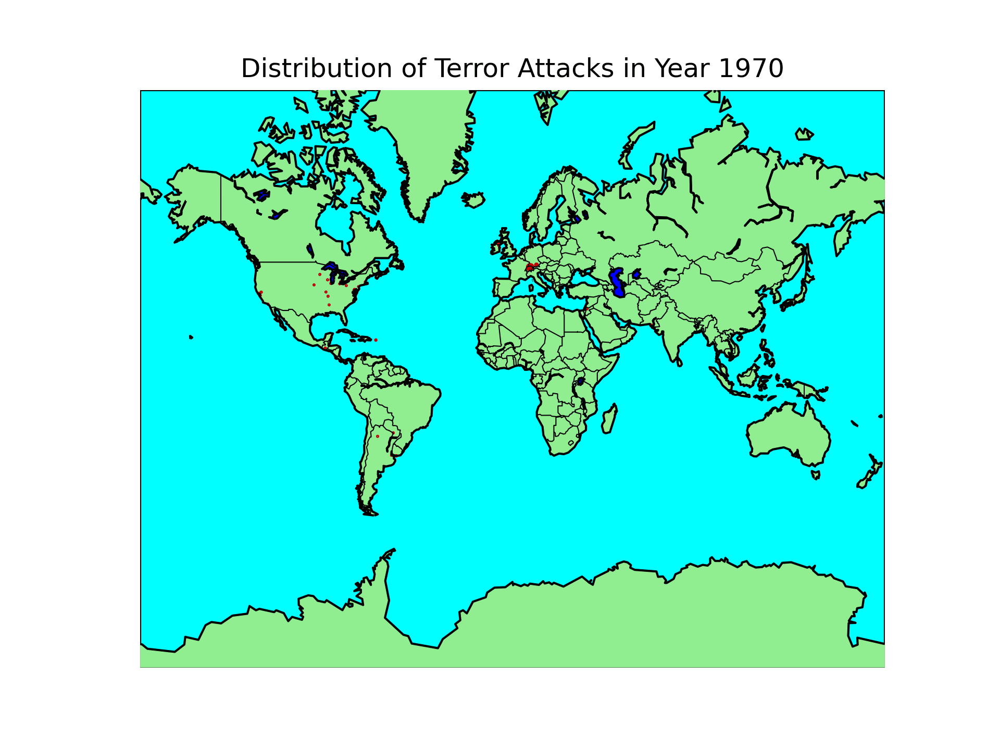

In [37]:
display(IPImage('output.gif'))

In [38]:
data_india=data1[data1.country_txt=='India']

In [39]:
fig2=plt.figure(figsize=(6,8))
def india_year_wise(year):
    plt.clf()
    indiamap=Basemap(projection='merc',llcrnrlat=6,urcrnrlat=38,llcrnrlon=68,urcrnrlon=98,resolution='i')
    indiamap.drawcoastlines()
    indiamap.drawcountries()
    indiamap.drawstates()
    indiamap.fillcontinents(color='lightgreen',lake_color='blue')
    indiamap.drawmapboundary(fill_color='aqua')
    data_indiayear=data_india[data_india.iyear==year]
    lat=list(data_indiayear.latitude)
    lon=list(data_indiayear.longitude)
    x,y=indiamap(lon,lat)
    indiamap.scatter(x,y,color='red',marker='.',s=data_indiayear.nkill.values*0.7)
    plt.title('Distribution of Terror Attacks in India in the '+f'Year {year}')
    plt.axis('off')
    plt.savefig('Indiamap'+str(year)+'.png', dpi=300)
    plt.close()
    image = PILImage.open('Indiamap'+str(year)+'.png')
    return image

<Figure size 600x800 with 0 Axes>

In [40]:
years=np.arange(1970,2018)
indiaframes=[]
for year in years:
    image=india_year_wise(year)
    indiaframes.append(image)
    time.sleep(0.5)
imageio.mimsave('India.gif',indiaframes,fps=0.67)

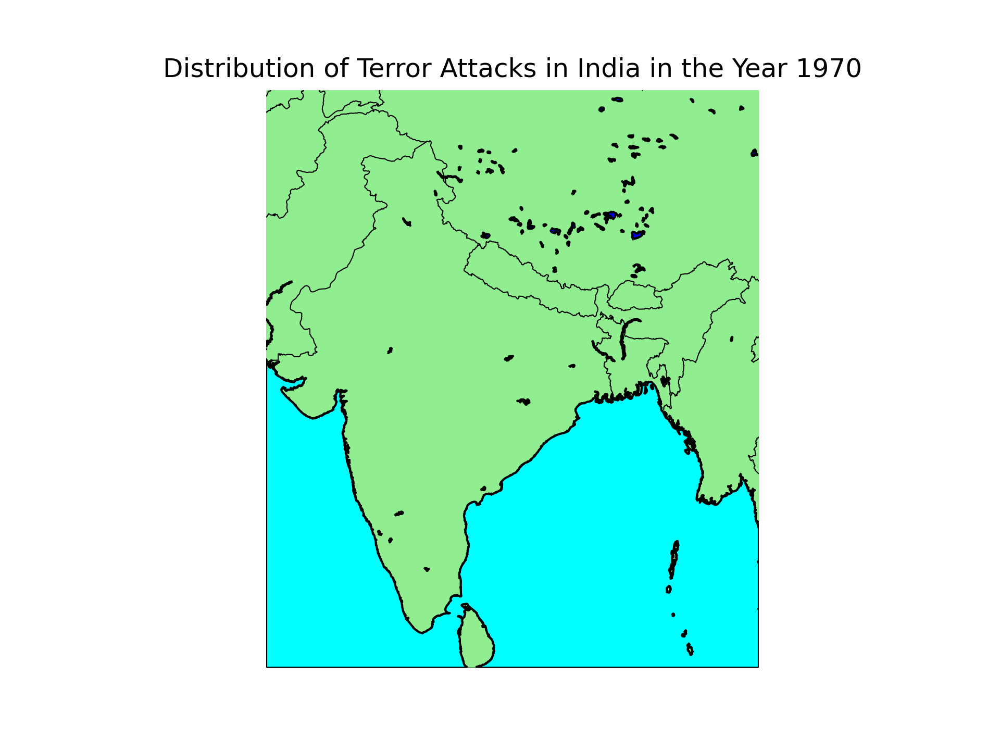

In [41]:
display(IPImage('India.gif'))

<Axes: xlabel='count', ylabel='claimmode_txt'>

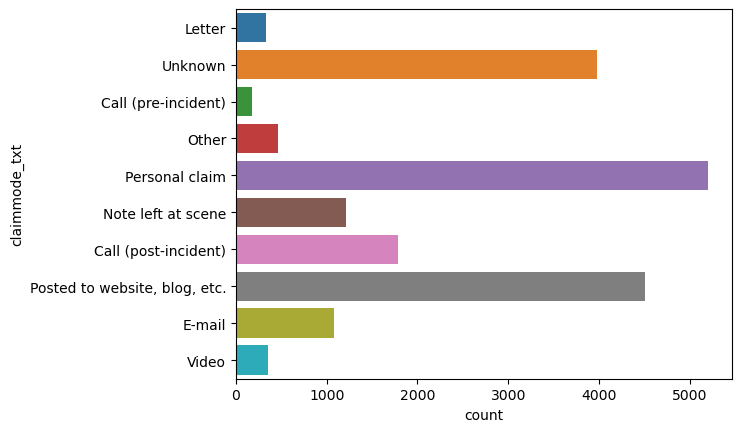

In [42]:
# Countplot of mode over which terror claims were made
sns.countplot(data=data,y='claimmode_txt')

Text(0.5, 1.0, 'Top 15 Terror Groups with most number of Terror Attacks in India')

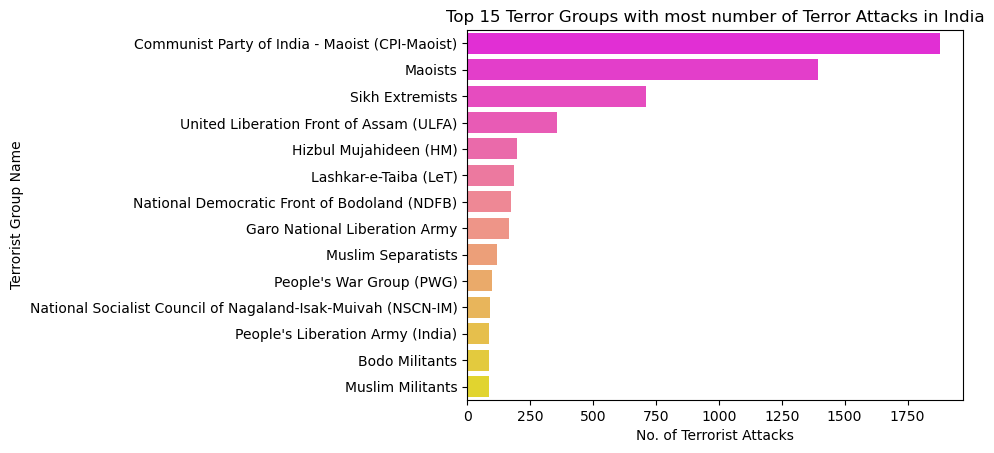

In [43]:
# Countplot of different Groups or Organisations responsible for Terror Attacks over India
sns.countplot(data=data_india,y='gname',order=data_india.gname.value_counts().index[1:15],palette='spring')
plt.xlabel('No. of Terrorist Attacks')
plt.ylabel('Terrorist Group Name')
plt.title('Top 15 Terror Groups with most number of Terror Attacks in India')

From the above graph, we can see that 'CPI-Maoist','Maoists','Sikh Extremists','ULFA' are the major terrror groups in India.

Text(0.5, 1.0, 'Top 15 Terror Groups with most number of Terror Attacks in the World')

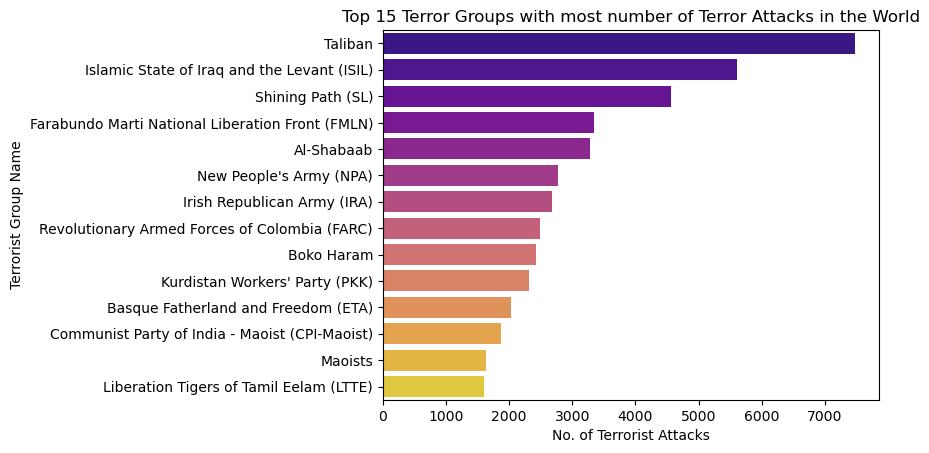

In [44]:
# Countplot of Top 15 Terror Groups with most number of Terror Attacks in the world
sns.countplot(data=data,y='gname',order=data.gname.value_counts().index[1:15],palette='plasma')
plt.xlabel('No. of Terrorist Attacks')
plt.ylabel('Terrorist Group Name')
plt.title('Top 15 Terror Groups with most number of Terror Attacks in the World')

From the above graph, we can see that 'Taliban', 'ISIL', 'SL', 'FMLN' are the major terror groups with most number of terror attacks in the world.

Text(0.5, 1.0, 'Weapon Types Deployed for Terror Attack')

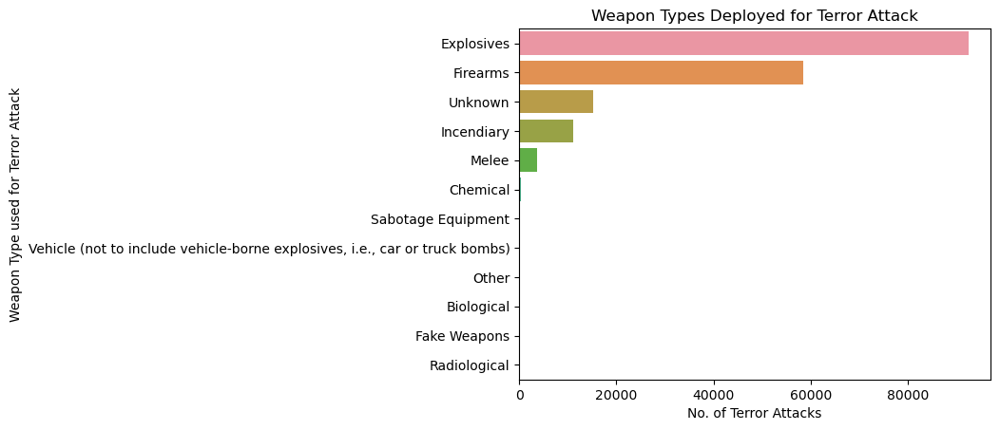

In [45]:
# Countplot of Weapon Types used for terror attack
sns.countplot(data=data1,y='weaptype1_txt',order=data1.weaptype1_txt.value_counts().index)
plt.xlabel('No. of Terror Attacks')
plt.ylabel('Weapon Type used for Terror Attack')
plt.title('Weapon Types Deployed for Terror Attack')

'Explosives', 'Firearms' are the major weapon types chosen for Terror Attack

### NLP Analysis of Articles covering Terror News:

In [46]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [47]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import re
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\SURESH\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\SURESH\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\SURESH\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [48]:
wordnetlemmatizer=WordNetLemmatizer()

In [49]:
data1_scite1=data1.scite1.dropna()

In [50]:
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\SURESH\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [51]:
def clean_text(text):
    cleaned=text.lower()
    cleaned=re.sub(r'https?://\S+',"",cleaned) #finds pattern https:// or http:// and 
                                               #replaces it along with non white space 
                                               #characters present beside it with blank space
    cleaned=re.sub(r'\\n'," ",cleaned) #replaces new line characters with blank space
    cleaned=re.sub(r'[@#!&](\w+)',r' \1',cleaned) # replaces special characters
    cleaned=re.sub(r'[.,\':/;-]',' ',cleaned) # replaces .,: and other characters
    return cleaned

In [52]:
# Function for tokenizing documents and lemmatizing words
def tokenize(text):
    cleaned=word_tokenize(text)
    cleaned=[wordnetlemmatizer.lemmatize(word) for word in cleaned if word not in stopwords.words('english')]
    cleaned_text=" ".join(cleaned)
    return cleaned_text

In [53]:
data_clean=data1.dropna()

In [54]:
# creating new column consisting cleaned text
data_clean['cleaned_text']=data_clean['scite1'].apply(lambda x:clean_text(x))
data_clean['cleaned_text']=data_clean['cleaned_text'].apply(lambda x:tokenize(x))

In [56]:
data_clean['cleaned_text']

5         `` police chief quits `` washington post janua...
7         committee government operation united state se...
8         tom bates `` rad 1970 bombing army math resear...
9         committee government operation united state se...
11        committee government operation united state se...
                                ...                        
181685    `` 4 people injured farayb explosion `` pajhwo...
181686    `` somalia al shabaab militant attack army che...
181687    `` putin victory syria turned farce turchynov ...
181688    `` maguindanao clash trap tribe member `` phil...
181689    `` trader escape grenade attack imphal `` busi...
Name: cleaned_text, Length: 102998, dtype: object

(-0.5, 799.5, 599.5, -0.5)

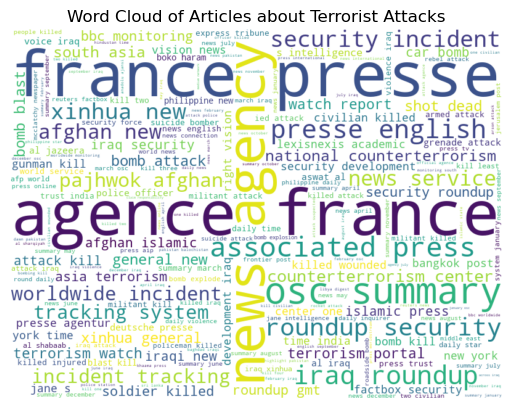

In [58]:
# Plotting Wordcloud
wordcloud=WordCloud(width=800, height=600, background_color='white').generate(" ".join(data_clean['cleaned_text']))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Articles about Terrorist Attacks')
plt.axis('off')